<div style="padding:10px; 
            color:black;
            margin:10px;
            font-size:150%;
            display:fill;
            border-radius:1px;
            border-style: solid;
            border-color:black;
            background-color:gold;
            overflow:hidden;">
    <center>
        <a id='top'></a>
        <b style="color:black">Table of Contents</b>
    </center>
    <br>
    <ul>
        <li>
            <a href="#1" style="color:black">1 - Imports</a>
        </li>
        <li>
            <a href="#2" style="color:black">2 - Data Preprocessing</a>
            <ul>
                <li>
                    <a href="#2-1" style="color:black">2.1 - Create Directories</a>
                </li>
                <li>
                    <a href="#2-2" style="color:black">2.2 - Creating Generators</a>
                </li>
            </ul>
        </li>
        <li>
            <a href="#3" style="color:black">3 - Model Implementation</a>
        </li>
        <li>
            <a href="#4" style="color:black">4 - Evaluation</a>
            <ul>
                <li>
                    <a href="#4-1" style="color:black">4.1 - Evaluation on Test Set</a>
                </li>
                <li>
                    <a href="#4-2" style="color:black">4.2 - Visualizing  Predictions</a>
                </li>
                <li>
<a href="#4-3" style="color:black">4.3 - Visualizing Activation Maps</a>
</li>
<li>
<a href="#4-4" style="color:black">4.4 - Visualizing Training Process</a>
</li>
</ul>
</li>
<li>
<a href="#5" style="color:black">5 - Trying Data Augmentation</a>
</li>
<li>
<a href="#6" style="color:black">6 - Conclusion</a>
</li>
<li>
<a href="#7" style="color:black">7 - Thank You</a>
</li>
</ul>

</div>


<a id="1"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Imports</center></h1>

In [1]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import random
import plotly.express as px
import scipy as sp

from scipy import ndimage
from shutil import copyfile
from tensorflow.keras.layers import Conv2D,Add,MaxPooling2D, Dense, BatchNormalization,Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator 

<a id="2"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Data Preprocessing</center></h1>

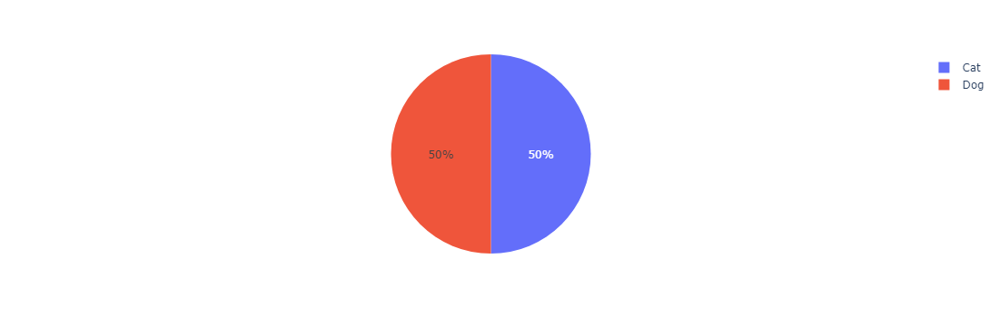

In [2]:
class_names = ['Cat', 'Dog'] 

n_dogs = len(os.listdir('C:\\Users\\LENOVO\\OneDrive\\Desktop\\jupyter notebook coding\\dag cat classifier\\FINAL\\kagglecatsanddogs_5340\\PetImages\\Dog'))
n_cats = len(os.listdir('C:\\Users\\LENOVO\\OneDrive\\Desktop\\jupyter notebook coding\\dag cat classifier\\FINAL\\kagglecatsanddogs_5340\\PetImages\\Cat'))
n_images = [n_cats, n_dogs]
px.pie(names=class_names, values=n_images)

<a name="2-1"></a>
## create directories for training and validation

In [3]:
# Create the top-level directory
os.makedirs('C:/tmp/cats-v-dogs', exist_ok=True)

# Create the subdirectories
os.makedirs('C:/tmp/cats-v-dogs/training', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/validation', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/test', exist_ok=True)

os.makedirs('C:/tmp/cats-v-dogs/training/cats', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/training/dogs', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/validation/cats', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/validation/dogs', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/test/cats', exist_ok=True)
os.makedirs('C:/tmp/cats-v-dogs/test/dogs', exist_ok=True)

In [4]:
#Define data path
CAT_DIR = 'C:\\Users\\LENOVO\\OneDrive\\Desktop\\jupyter notebook coding\\dag cat classifier\\FINAL\\kagglecatsanddogs_5340\\PetImages\\Cat'
DOG_DIR = 'C:\\Users\\LENOVO\\OneDrive\\Desktop\\jupyter notebook coding\\dag cat classifier\\FINAL\\kagglecatsanddogs_5340\\PetImages\\Dog'

TRAINING_DIR = "/tmp/cats-v-dogs/training/"
VALIDATION_DIR = "/tmp/cats-v-dogs/validation/"

TRAINING_CATS = os.path.join(TRAINING_DIR, "cats/")
VALIDATION_CATS = os.path.join(VALIDATION_DIR, "cats/")

TRAINING_DOGS = os.path.join(TRAINING_DIR, "dogs/")
VALIDATION_DOGS = os.path.join(VALIDATION_DIR, "dogs/")

# Define whether to include test split or not
INCLUDE_TEST = True

In [5]:
print(len(os.listdir('/tmp/cats-v-dogs/training/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/validation/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/validation/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/test/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/test/dogs')))

11250
11250
625
625
625
625


**Now let's create  a function to split the   data**


In [6]:
def split_data(main_dir, training_dir, validation_dir, test_dir=None, include_test_split = True,  split_size=0.9):
    """
    Splits the data into train validation and test sets (optional)

    Args:
    main_dir (string):  path containing the images
    training_dir (string):  path to be used for training
    validation_dir (string):  path to be used for validation
    test_dir (string):  path to be used for test
    include_test_split (boolen):  whether to include a test split or not
    split_size (float): size of the dataset to be used for training
    """
    files = []
    for file in os.listdir(main_dir):
        if  os.path.getsize(os.path.join(main_dir, file)): # check if the file's size isn't 0
            files.append(file) # appends file name to a list

    shuffled_files = random.sample(files,  len(files)) # shuffles the data
    split = int(0.9 * len(shuffled_files)) #the training split casted into int for numeric rounding
    train = shuffled_files[:split] #training split
    split_valid_test = int(split + (len(shuffled_files)-split)/2)
   
    if include_test_split:
        validation = shuffled_files[split:split_valid_test] # validation split
        test = shuffled_files[split_valid_test:]
    else:
        validation = shuffled_files[split:]

    for element in train:
        copyfile(os.path.join(main_dir,  element), os.path.join(training_dir, element)) # copy files into training directory

    for element in validation:
        copyfile(os.path.join(main_dir,  element), os.path.join(validation_dir, element))# copy files into validation directory
        
    if include_test_split:
        for element in test:
            copyfile(os.path.join(main_dir,  element), os.path.join(test_dir, element)) # copy files into test directory
    print("Split sucessful!")

**Now let's call the function to create the  training/validation data**

In [7]:
split_data(CAT_DIR, '/tmp/cats-v-dogs/training/cats', '/tmp/cats-v-dogs/validation/cats', '/tmp/cats-v-dogs/test/cats',INCLUDE_TEST, 0.9)
split_data(DOG_DIR, '/tmp/cats-v-dogs/training/dogs', '/tmp/cats-v-dogs/validation/dogs','/tmp/cats-v-dogs/test/dogs',INCLUDE_TEST, 0.9)

Split sucessful!
Split sucessful!


**As a sanity check let's check the data directories**


In [8]:
print(len(os.listdir('/tmp/cats-v-dogs/training/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/validation/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/validation/dogs')))


print(len(os.listdir('/tmp/cats-v-dogs/test/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/test/dogs')))

12379
12376
1221
1215
1216
1223


<a name="2-2"></a>

## Create Generators

In [9]:
train_gen = ImageDataGenerator(
        rescale=1./255)


validation_gen =  ImageDataGenerator(
        rescale=1./255.)

if INCLUDE_TEST:
    test_gen =  ImageDataGenerator(
            rescale=1./255.)


In [10]:
train_generator = train_gen.flow_from_directory(
        '/tmp/cats-v-dogs/training',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')
validation_generator = validation_gen.flow_from_directory(
        '/tmp/cats-v-dogs/validation',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')

if INCLUDE_TEST:
    test_generator = test_gen.flow_from_directory(
        '/tmp/cats-v-dogs/validation',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')

Found 24753 images belonging to 2 classes.
Found 2436 images belonging to 2 classes.
Found 2436 images belonging to 2 classes.


**Now let's make sure we got the correct data**


In [11]:
class_names = ['Cat', 'Dog']
def plot_data(generator, n_images):
    """
    Plots random data from dataset
    Args:
    generator: a generator instance
    n_images : number of images to plot
    """
    i = 1
    images, labels = generator.next()
    labels = labels.astype('int32')

    plt.figure(figsize=(14, 15))
    
    for image, label in zip(images, labels):
        plt.subplot(4, 3, i)
        plt.imshow(image)
        plt.title(class_names[label])
        plt.axis('off')
        i += 1
        if i == n_images:
            break
    
    plt.show()

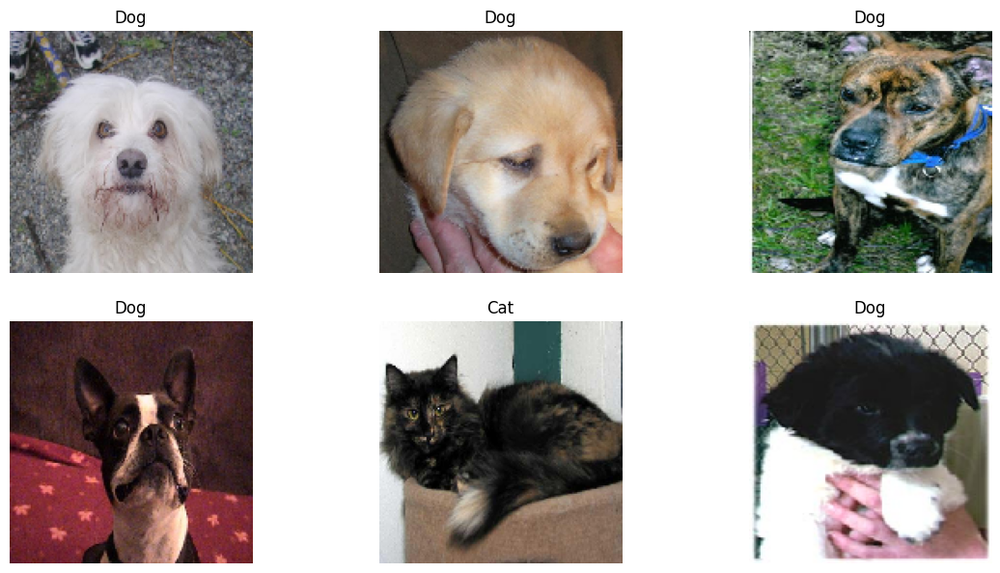

In [12]:
plot_data(train_generator,7)


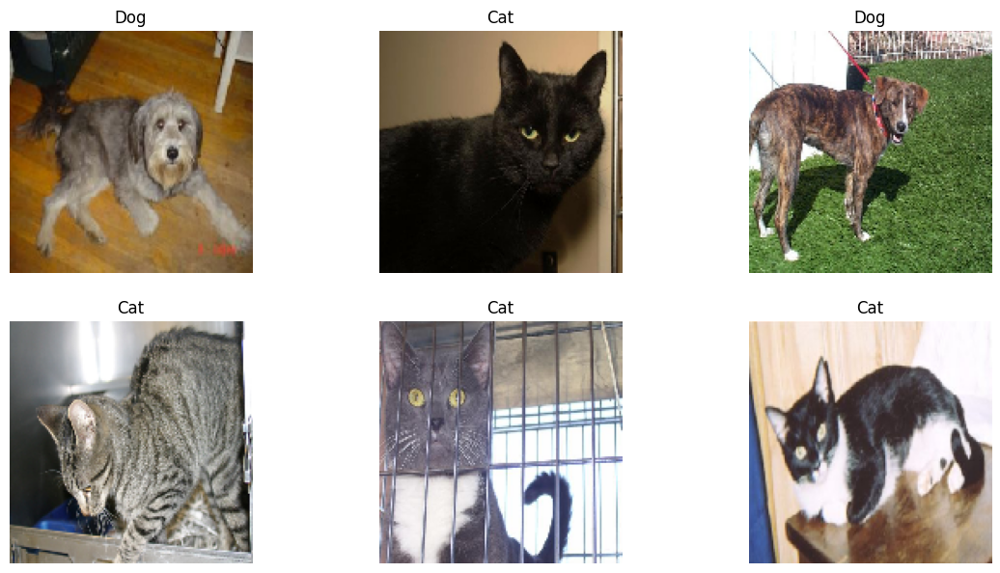

In [13]:
plot_data(validation_generator,7)


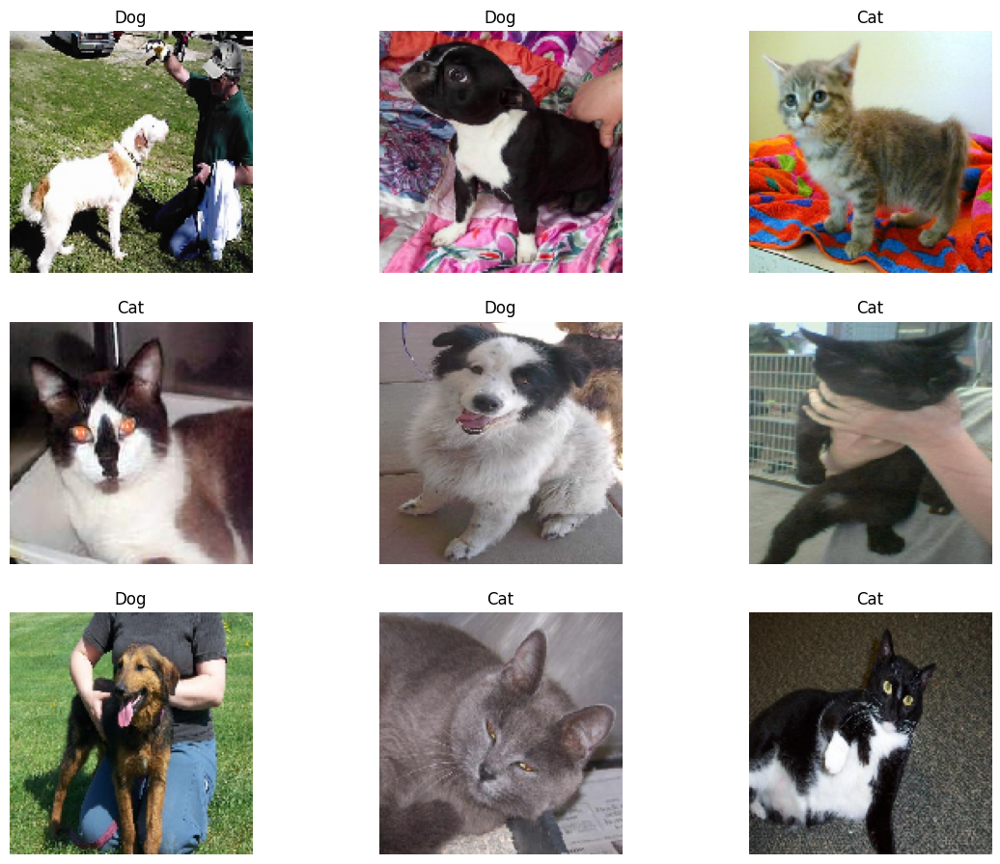

In [14]:
if INCLUDE_TEST:
    plot_data(test_generator, 10)

**Great, now that the data is ready let's train our model**


<a id="3"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Model Implementation</center></h1>

In [15]:
inputs = tf.keras.layers.Input(shape=(150,150,3))
x =  tf.keras.layers.Conv2D(32, (3,3), activation='relu')(inputs)
x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)

x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)
x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)

x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
x = tf.keras.layers.Conv2D(256, (3,3), activation='relu')(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = Dense(1024,activation='relu')(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x) 

model = Model(inputs=inputs, outputs=x)

In [16]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics = ['accuracy'])

In [17]:
r = model.fit(
        train_generator,
        epochs=10,#Training longer could yield better results
        validation_data=validation_generator)

Epoch 1/10


148/387 [==========>...................] - ETA: 9:55 - loss: 0.6920 - accuracy: 0.5202

C:\Users\LENOVO\AppData\Roaming\Python\Python311\site-packages\PIL\TiffImagePlugin.py:864: UserWarning:

Truncated File Read



387/387 [==============================] - 1079s 3s/step - loss: 0.6811 - accuracy: 0.5637 - val_loss: 0.6815 - val_accuracy: 0.5686
Epoch 2/10
387/387 [==============================] - 989s 3s/step - loss: 0.6455 - accuracy: 0.6253 - val_loss: 0.6334 - val_accuracy: 0.6416
Epoch 3/10
387/387 [==============================] - 1106s 3s/step - loss: 0.6163 - accuracy: 0.6630 - val_loss: 0.5803 - val_accuracy: 0.7036
Epoch 4/10
387/387 [==============================] - 1075s 3s/step - loss: 0.5888 - accuracy: 0.6930 - val_loss: 0.5577 - val_accuracy: 0.7204
Epoch 5/10
387/387 [==============================] - 877s 2s/step - loss: 0.5675 - accuracy: 0.7076 - val_loss: 0.5556 - val_accuracy: 0.7225
Epoch 6/10
387/387 [==============================] - 761s 2s/step - loss: 0.5551 - accuracy: 0.7204 - val_loss: 0.5238 - val_accuracy: 0.7410
Epoch 7/10
387/387 [==============================] - 758s 2s/step - loss: 0.5383 - accuracy: 0.7315 - val_loss: 0.5364 - val_accuracy: 0.7381
Epoch 8

<a id="4"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Evaluation</center></h1>

<a name="4-1"></a>

## Evaluate the model on the test set

In [18]:
if INCLUDE_TEST:
    model.evaluate(test_generator)

39/39 [==============================] - 25s 632ms/step - loss: 0.5105 - accuracy: 0.7406


<a name="4-2"></a>

## Visualize the predicitons

In [19]:
def plot_prediction(generator, n_images):
    """
    Test the model on random predictions
    Args:
    generator: a generator instance
    n_images : number of images to plot

    """
    i = 1
    # Get the images and the labels from the generator
    images, labels = generator.next()
    # Gets the model predictions
    preds = model.predict(images)
    predictions = np.argmax(preds, axis=1)
    labels = labels.astype('int32')
    plt.figure(figsize=(14, 15))
    for image, label in zip(images, labels):
        plt.subplot(4, 3, i)
        plt.imshow(image)
        if predictions[i] == labels[i]:
            title_obj = plt.title(class_names[label])
            plt.setp(title_obj, color='g') 
            plt.axis('off')
        else:
            title_obj = plt.title(class_names[label])
            plt.setp(title_obj, color='r') 
            plt.axis('off')
        i += 1
        if i == n_images:
            break
    
    plt.show()

2/2 [==============================] - 2s 276ms/step


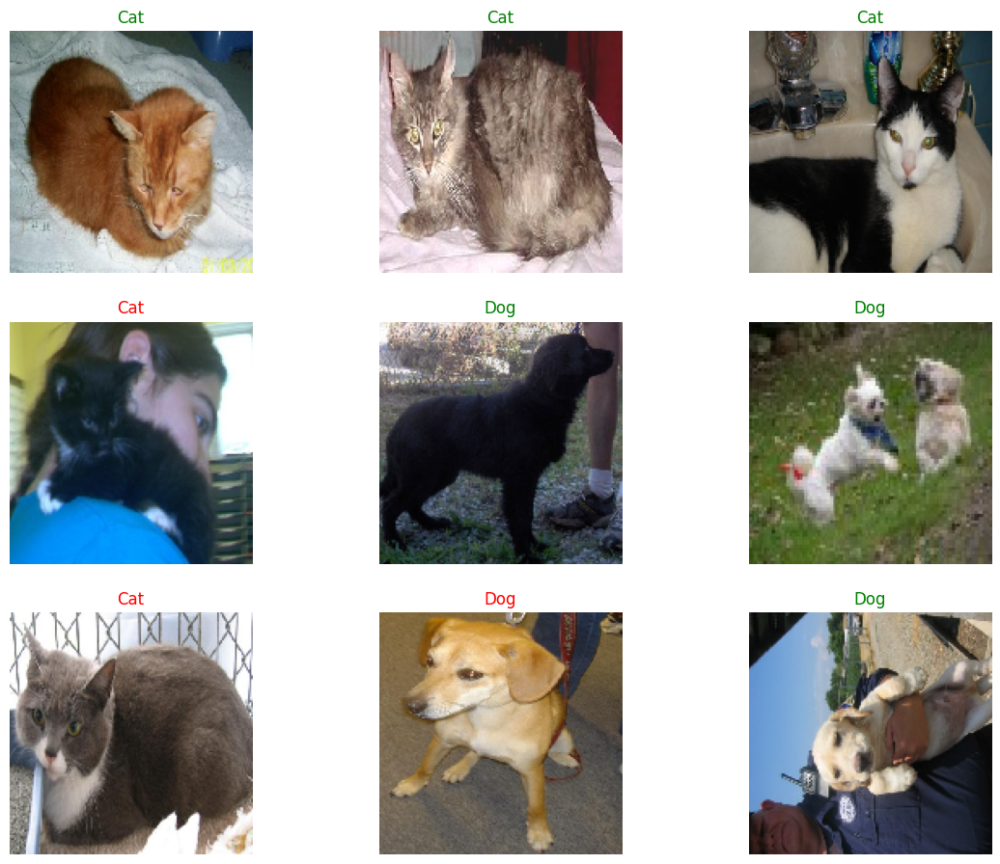

In [20]:
if INCLUDE_TEST:
    plot_prediction(test_generator, 10)

2/2 [==============================] - 1s 275ms/step


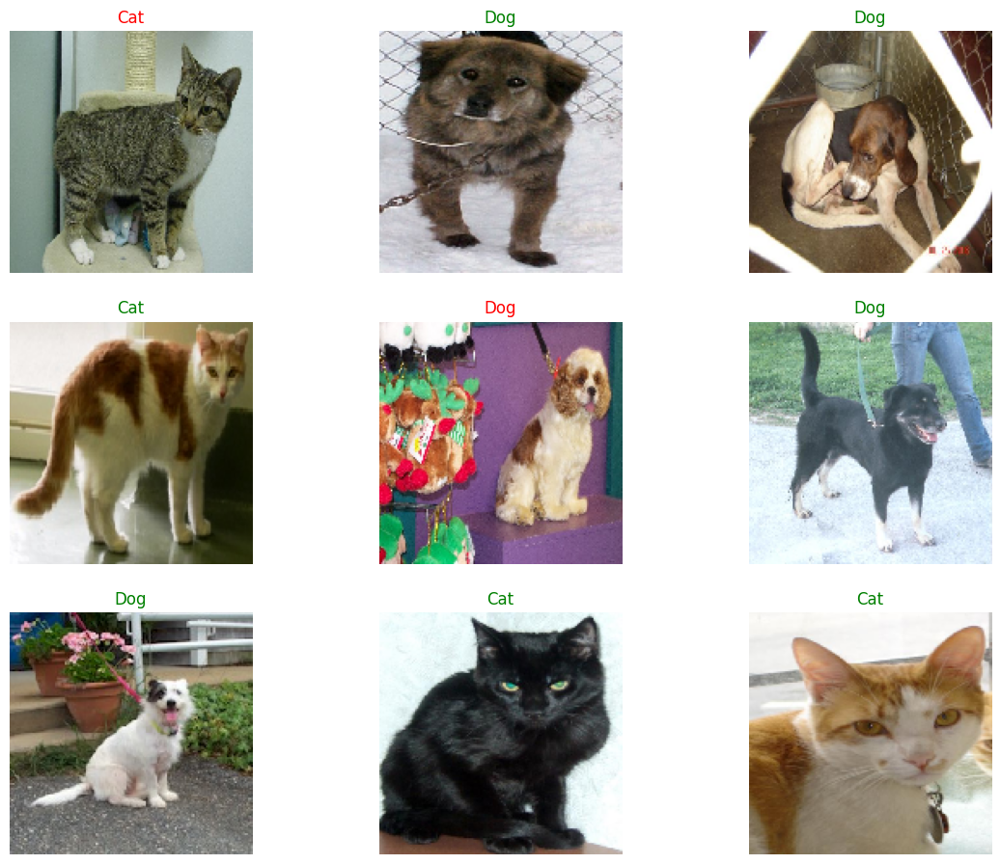

In [21]:
plot_prediction(validation_generator, 10)

<a name="4-3"></a>

## Visualize class activation maps

In [22]:
# Create a  model to visualize activation maps
gp_weights =  model.get_layer('dense').get_weights()[0]
activation_model = Model(model.inputs, outputs=(model.get_layer('conv2d_5').output, model.get_layer('dense_1').output))

In [23]:
# Use the model to make predictions on the test generator
images, _ = test_generator.next()
features, results = activation_model.predict(images)

2/2 [==============================] - 1s 260ms/step


In [24]:
def show_cam(image_index, features, results):
    """
    Shows activation maps
    Args:
    image_index: index of image
    features: the extracted features
    results: model's predictions
    """
    # takes the features of the chosen image
    features_for_img = features[image_index,:,:,:]

    # get the class with the highest output probability
    prediction = np.argmax(results[image_index])

    # get the gap weights at the predicted class
    class_activation_weights = gp_weights[:,prediction]

    # upsample the features to the image's original size (150 x 150)
    class_activation_features = sp.ndimage.zoom(features_for_img, (150/30, 150/30, 1), order=2)

    # compute the intensity of each feature in the CAM
    cam_output  = np.dot(class_activation_features,class_activation_weights)

    print('Predicted Class = ' +str(class_names[prediction])+ ', Probability = ' + str(results[image_index][prediction]))

    # show the upsampled image
    
    plt.imshow(images[image_index])

    # strongly classified (95% probability) images will be in green, else red
    if results[image_index][prediction]>0.95:
        cmap_str = 'Greens'
    else:
        cmap_str = 'Blues'

    # overlay the cam output
    plt.imshow(cam_output, cmap=cmap_str, alpha=0.5)

    # display the image
    plt.show()

In [25]:
def show_maps(desired_class, num_maps):
    '''
    goes through the first 10,000 test images and generates Cam activation maps
    Args:
    desired_class: class to show the maps for
    num_maps: number of maps to be generated 
    '''
    counter = 0
    # go through the first 10000 images
    for i in range(0,10000):
        # break if we already displayed the specified number of maps
        if counter == num_maps:
            break

        # images that match the class will be shown
        if np.argmax(results[i]) == desired_class:
            counter += 1
            show_cam(i,features, results)

Predicted Class = Dog, Probability = 0.6787148


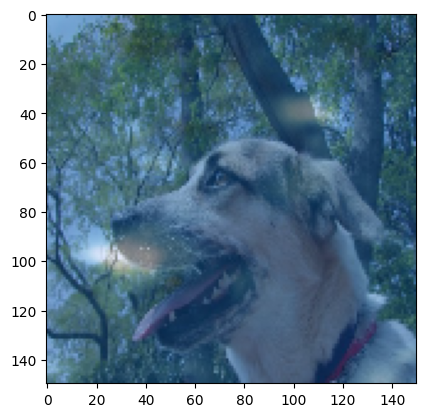

Predicted Class = Dog, Probability = 0.7002138


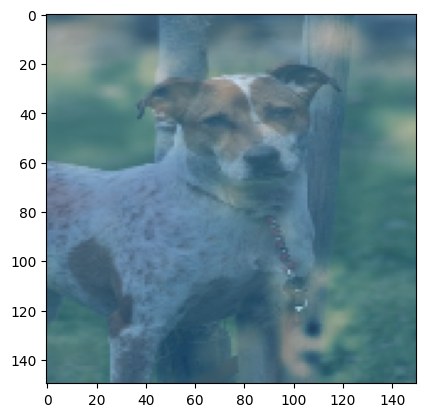

Predicted Class = Dog, Probability = 0.80831313


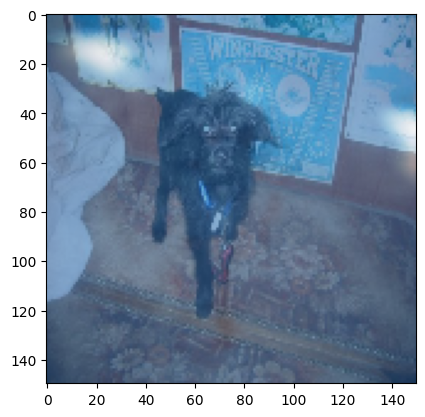

Predicted Class = Dog, Probability = 0.8515992


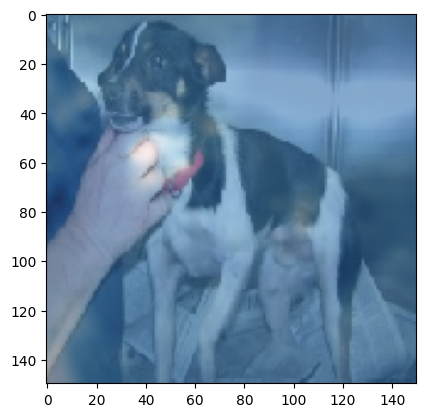

Predicted Class = Dog, Probability = 0.5377131


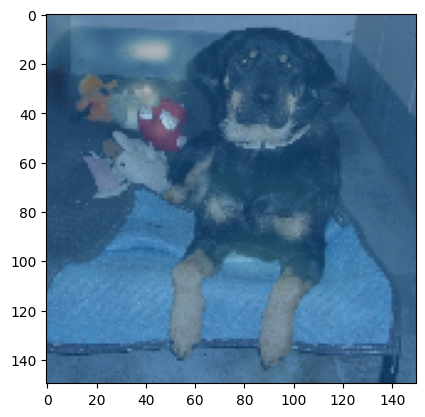

In [26]:
show_maps(desired_class=1, num_maps=5)

Predicted Class = Cat, Probability = 0.98779047


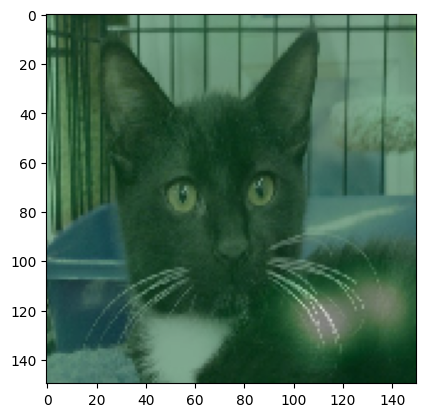

Predicted Class = Cat, Probability = 0.8165293


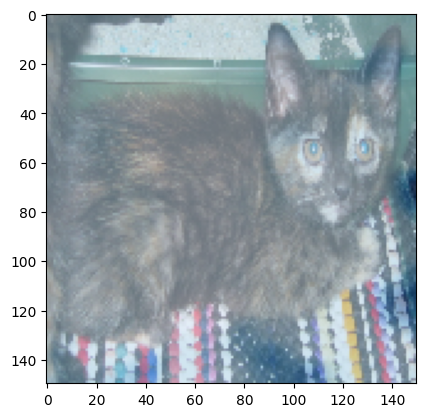

Predicted Class = Cat, Probability = 0.7717249


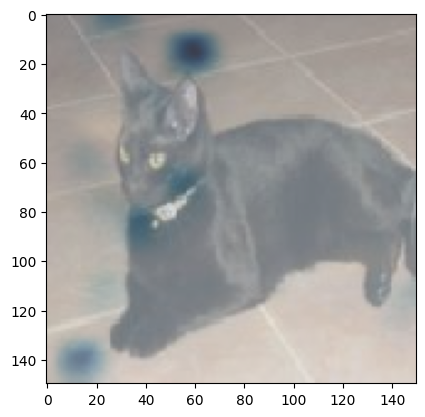

Predicted Class = Cat, Probability = 0.9484969


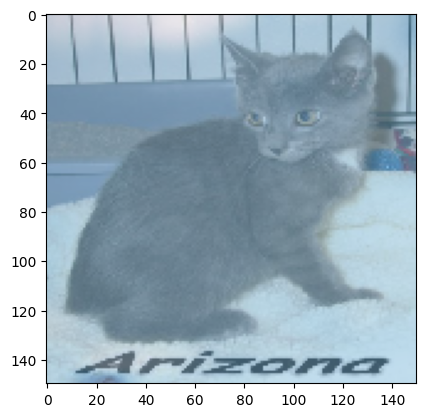

Predicted Class = Cat, Probability = 0.817117


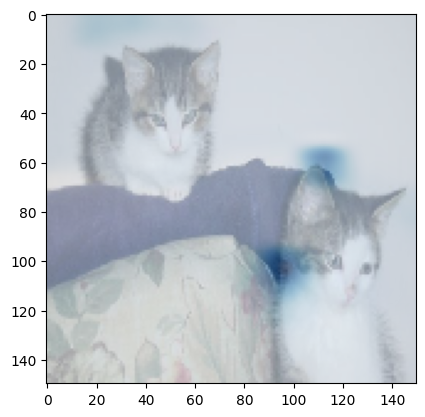

In [27]:
show_maps(desired_class=0, num_maps=5)

<a name="4-4"></a>

## Visualize training process

In [36]:
results = pd.DataFrame(r.history)
results

,loss,accuracy,val_loss,val_accuracy
0,0.681125,0.563689,0.681470,0.568555
1,0.645475,0.625258,0.633434,0.641626
2,0.616291,0.663031,0.580281,0.703613
3,0.588783,0.692967,0.557675,0.720443
4,0.567470,0.707591,0.555637,0.722496
5,0.555101,0.720438,0.523773,0.740969
6,0.538342,0.731548,0.536395,0.738095
7,0.525570,0.739628,0.533674,0.728243
8,0.503006,0.758211,0.557478,0.703613
9,0.483582,0.775744,0.510502,0.740558


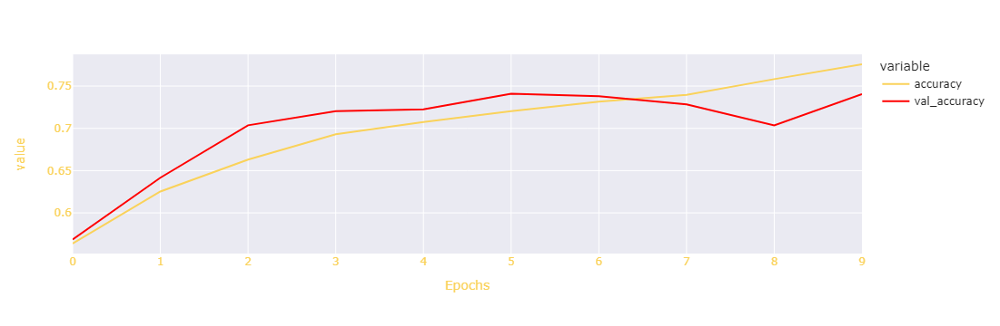

In [37]:
fig = px.line(results,y=[results['accuracy'],results['val_accuracy']],template="seaborn",color_discrete_sequence=['#fad25a','red'])
fig.update_layout(   
    title_font_color="#fad25a", 
    xaxis=dict(color="#fad25a",title='Epochs'), 
    yaxis=dict(color="#fad25a")
 )
fig.show()

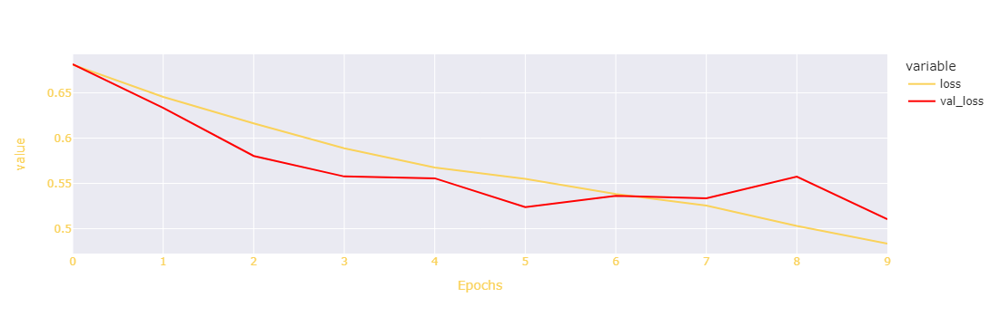

In [38]:
fig = px.line(results,y=[results['loss'],results['val_loss']],template="seaborn",color_discrete_sequence=['#fad25a','red'])
fig.update_layout(   
    title_font_color="#fad25a", 
    xaxis=dict(color="#fad25a",title='Epochs'), 
    yaxis=dict(color="#fad25a")
 )
fig.show()

<a id="5"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Trying Data Augmentation </center></h1>

In [39]:
train_gen_aug = ImageDataGenerator(
        rescale=1./255,fill_mode='nearest',horizontal_flip=True,
        rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
)


validation_gen_aug =  ImageDataGenerator(
        rescale=1./255.)


In [40]:
train_generator = train_gen_aug.flow_from_directory(
        '/tmp/cats-v-dogs/training',
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')
validation_generator = validation_gen_aug.flow_from_directory(
        '/tmp/cats-v-dogs/validation',
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

Found 24753 images belonging to 2 classes.
Found 2436 images belonging to 2 classes.


In [41]:
inputs = tf.keras.layers.Input(shape=(150,150,3))
x =  tf.keras.layers.Conv2D(32, (3,3), activation='relu')(inputs)
x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)

x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)
x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)

x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
x = tf.keras.layers.Conv2D(256, (3,3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2,2)(x)


x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x) 
x = tf.keras.layers.Dense(2, activation='softmax')(x) 

model_aug = Model(inputs=inputs, outputs=x)

In [42]:
model_aug.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics = ['accuracy'])

In [43]:
r = model_aug.fit(
        train_generator,
        epochs=10,#Training longer could yield better results
        validation_data=validation_generator)

Epoch 1/10
200/774 [======>.......................] - ETA: 16:05 - loss: 0.7071 - accuracy: 0.4986

C:\Users\LENOVO\AppData\Roaming\Python\Python311\site-packages\PIL\TiffImagePlugin.py:864: UserWarning:

Truncated File Read



774/774 [==============================] - 1261s 2s/step - loss: 0.6938 - accuracy: 0.5268 - val_loss: 0.6685 - val_accuracy: 0.5817
Epoch 2/10
774/774 [==============================] - 1217s 2s/step - loss: 0.6515 - accuracy: 0.6167 - val_loss: 0.6093 - val_accuracy: 0.6802
Epoch 3/10
774/774 [==============================] - 1275s 2s/step - loss: 0.5887 - accuracy: 0.6901 - val_loss: 0.5863 - val_accuracy: 0.7118
Epoch 4/10
774/774 [==============================] - 1281s 2s/step - loss: 0.5366 - accuracy: 0.7344 - val_loss: 0.4669 - val_accuracy: 0.7648
Epoch 5/10
774/774 [==============================] - 1280s 2s/step - loss: 0.4960 - accuracy: 0.7602 - val_loss: 0.4752 - val_accuracy: 0.7594
Epoch 6/10
774/774 [==============================] - 1278s 2s/step - loss: 0.4460 - accuracy: 0.7960 - val_loss: 0.3481 - val_accuracy: 0.8469
Epoch 7/10
774/774 [==============================] - 1282s 2s/step - loss: 0.3879 - accuracy: 0.8290 - val_loss: 0.6466 - val_accuracy: 0.7069
Epo

In [44]:
results = pd.DataFrame(r.history)
results

,loss,accuracy,val_loss,val_accuracy
0,0.693816,0.526764,0.668454,0.581691
1,0.651504,0.616733,0.609292,0.680213
2,0.588693,0.690139,0.586306,0.711823
3,0.536625,0.734376,0.466923,0.764778
4,0.496037,0.760231,0.475228,0.759442
5,0.446044,0.796025,0.348072,0.846880
6,0.387866,0.829031,0.646630,0.706897
7,0.348095,0.849109,0.385671,0.824302
8,0.317634,0.866764,0.393161,0.873153
9,0.303926,0.871248,0.180998,0.928161


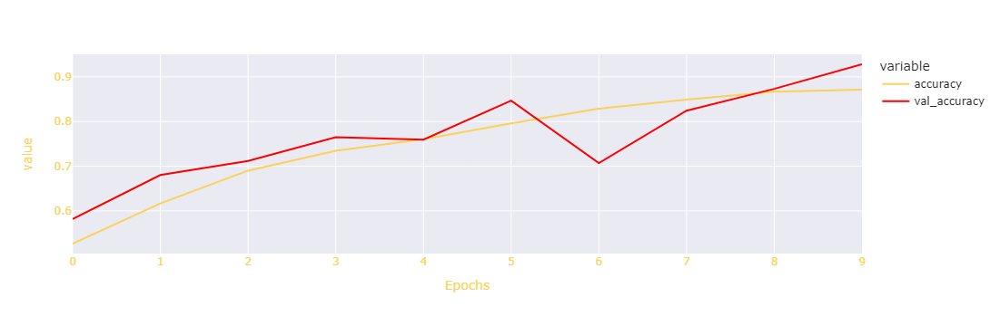

In [45]:
fig = px.line(results,y=[results['accuracy'],results['val_accuracy']],template="seaborn",color_discrete_sequence=['#fad25a','red'])
fig.update_layout(   
    title_font_color="#fad25a", 
    xaxis=dict(color="#fad25a",title='Epochs'), 
    yaxis=dict(color="#fad25a")
 )
fig.show()

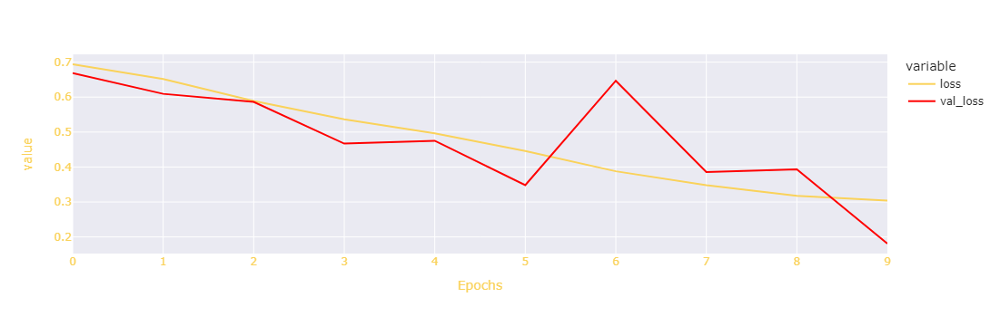

In [46]:
fig = px.line(results,y=[results['loss'],results['val_loss']],template="seaborn",color_discrete_sequence=['#fad25a','red'])
fig.update_layout(   
    title_font_color="#fad25a", 
    xaxis=dict(color="#fad25a",title='Epochs'), 
    yaxis=dict(color="#fad25a")
 )
fig.show()

<a id="5"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Conclusion </center></usion 

**Using data augmentation with these hyper-parameters gave us worse results**


**We can Use [transfer learning](https://www.kaggle.com/code/fareselmenshawii/introdution-to-transfer-learning/edit/run/109466477) or a more complex architecture to solve this probleoks**

<a id="7"></a>
<h1 style='background:#FFD700;border:0; color:black;
    box-shadow: 10px 10px 5px 0px rgba(0,0,0,0.75);
    transform: rotateX(10deg);
    '><center style='color: black;'>Thank You </center></hy feedback**y feedback**



    
# Thank You

**Thank you for taking your time and going through this notebook**

**Please let me know if you have any feedback**k**